# Subclustering of trunk ectoderm in bcd-RNAi

In [1]:
# load packages
library(Seurat)
library(ggplot2)
library(magrittr)
library(data.table)
library(Matrix)
library(dplyr)
library(tibble)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:data.table’:

    between, first, last


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [2]:
sessionInfo()

R version 4.0.3 (2020-10-10)
Platform: x86_64-apple-darwin17.0 (64-bit)
Running under: macOS Catalina 10.15.7

Matrix products: default
BLAS:   /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRblas.dylib
LAPACK: /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRlapack.dylib

locale:
[1] ja_JP.UTF-8/ja_JP.UTF-8/ja_JP.UTF-8/C/ja_JP.UTF-8/ja_JP.UTF-8

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
[1] tibble_3.0.5      dplyr_1.0.3       Matrix_1.3-2      data.table_1.13.6
[5] magrittr_2.0.1    ggplot2_3.3.3     Seurat_3.2.3     

loaded via a namespace (and not attached):
  [1] nlme_3.1-151          matrixStats_0.57.0    RcppAnnoy_0.0.18     
  [4] RColorBrewer_1.1-2    httr_1.4.2            repr_1.1.0           
  [7] sctransform_0.3.2     tools_4.0.3           R6_2.5.1             
 [10] irlba_2.3.3           rpart_4.1-15          KernSmooth_2.23-18   
 [13] uwot_0.1.10           mgcv

In [3]:
#load data
seu_HQC <- readRDS(file = '../../data/seurat_object/bcdRNAi/seu_HQC2_bcdRNAi.obj')
seu_HQC

An object of class Seurat 
28612 features across 6473 samples within 2 assays 
Active assay: SCT (11108 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, tsne

Warning message:
“Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session.”


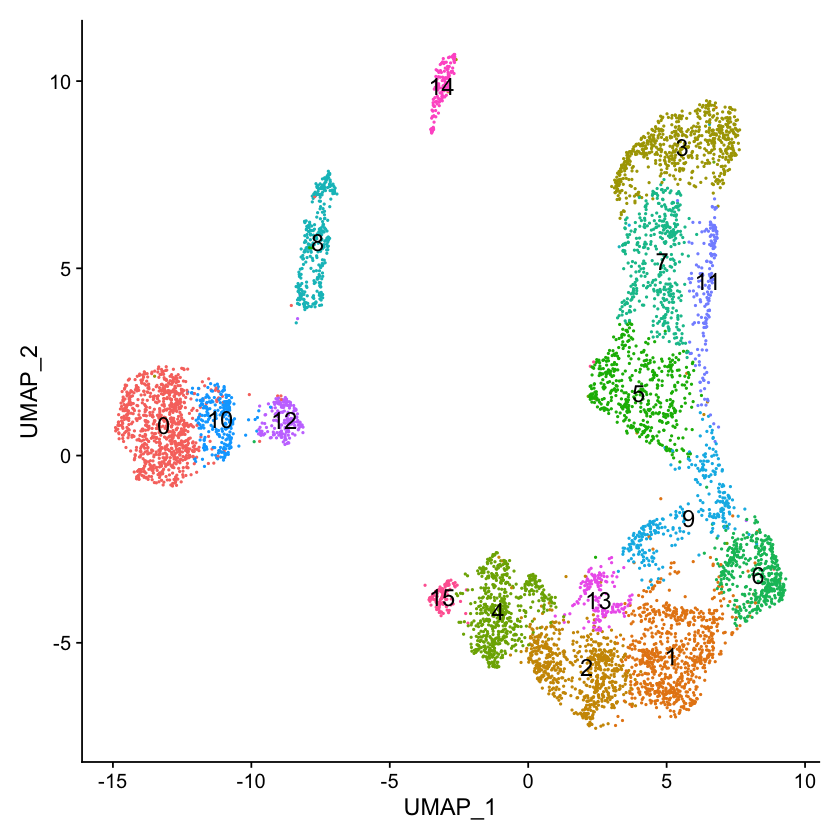

In [4]:
Idents(seu_HQC) <- 'seurat_clusters'
DimPlot(seu_HQC, reduction =  "umap", label = TRUE, label.size = 5) + NoLegend()

## Picking up target clusters

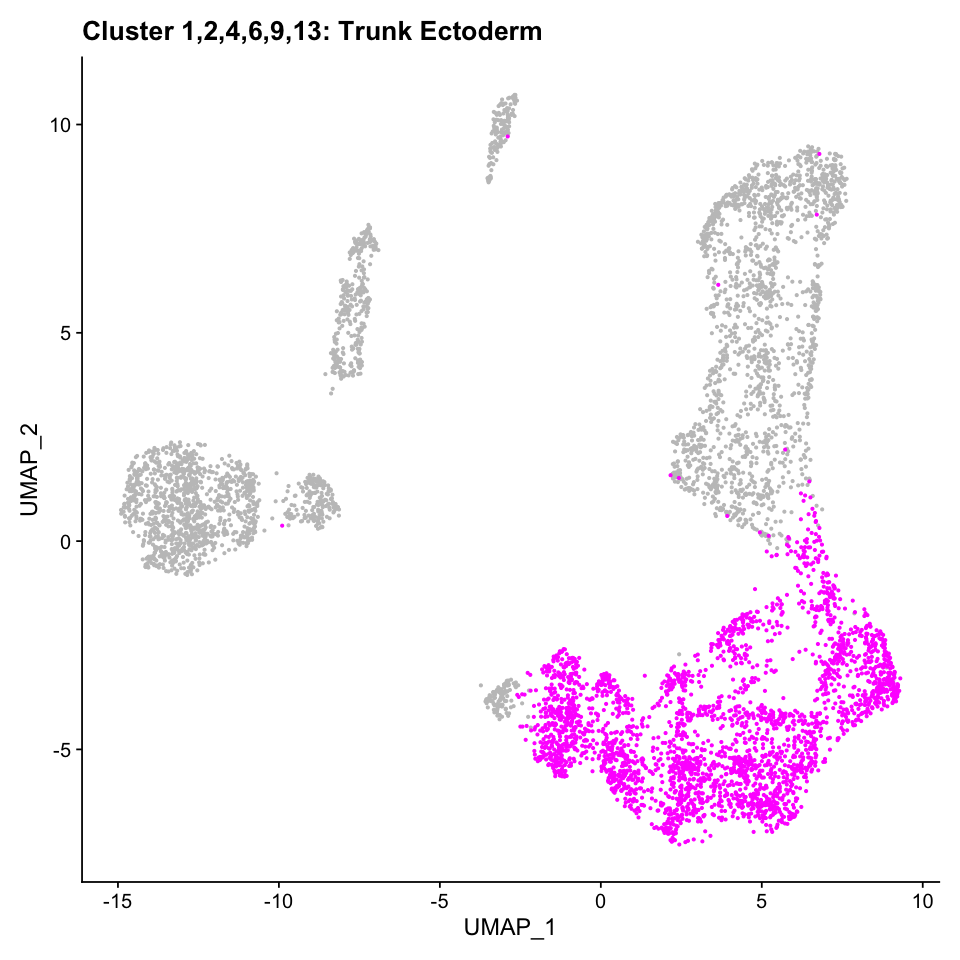

In [5]:
options(repr.plot.width=8, repr.plot.height=8)
highlight.cells <- WhichCells(seu_HQC,idents = c(1,2,4,6,9,13))
DimPlot(seu_HQC, reduction =  "umap", cells.highlight = highlight.cells, pt.size = 0.5, sizes.highlight = 0.5,
        cols.highlight = 'magenta', label = FALSE) + NoLegend() + ggtitle(
    'Cluster 1,2,4,6,9,13: Trunk Ectoderm')

In [6]:
seu.ecto <- subset(seu_HQC, idents = c(1,2,4,6,9,13))
seu.ecto

An object of class Seurat 
28612 features across 2926 samples within 2 assays 
Active assay: SCT (11108 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, tsne

In [7]:
seu.ecto$cluster.allcell <- seu.ecto$seurat_clusters

## Clustering

In [8]:
DefaultAssay(seu.ecto) <- "RNA"
seu.ecto <- suppressWarnings(SCTransform(seu.ecto, vars.to.regress = c("percent.mt", "percent.rRNA")))

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 9870 by 2926

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 2926 cells



  |======================================================================| 100%


Found 125 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 9870 genes



  |======================================================================| 100%


Computing corrected count matrix for 9870 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 28.6583 secs

Determine variable features

Set 3000 variable features

Place corrected count matrix in counts slot

Regressing out percent.mt, percent.rRNA

Centering data matrix

Set default assay to SCT



PC_ 1 
Positive:  peb, mirr, CG45263, Svil, egr, Ance, tup, cv-2, Alk, Dtg 
	   srp, Doc1, dap, prage, Doc3, scyl, CrebA, MFS14, chrb, glec 
	   hbs, CG42342, Z600, emc, ush, kay, sas, rst, fj, bun 
Negative:  SoxN, sog, sca, ImpL2, D, ths, Toll-6, Tet, E(spl)mgamma-HLH, Cys 
	   trn, Dl, brk, CG43355-sala, hth, wb, Meltrin, Tollo, slp1, pri 
	   lncRNA:Hsromega, gsb, Obp99a, CG17724-Kdm4B-seq, Ocho, pros, robo2, stg, CG8654, rdx 
PC_ 2 
Positive:  sog, D, SoxN, pnt, sca, peb, vn, CG43355-sala, wntD, halo 
	   Cys, Ance, dap, brk, E(spl)mgamma-HLH, Doc3, esg, prage, glec, CG17724-Kdm4B-seq 
	   egr, gsb, vnd, Dtg, CG13653, CrebA, Ilp4, scyl, rho, sad 
Negative:  stg, Atx-1, dpp, bbg, shn, Egfr, aop, CG10011, aos, lncRNA:CR43887 
	   cic, wb, CG34224, Myc, cv-2, opa, pnr, zld, ich, Mkp3 
	   pri, wech, lncRNA:CR43432, RapGAP1, grh, Shroom, tsh, hth, DNaseII, fra 
PC_ 3 
Positive:  Abd-B, RpL27A, RpS4, CG10035, RpS15, eEF1alpha1, Fer2LCH, CG13427, Fer1HCH, Ama 
	   RpS20, tsr, RpL21, RpL

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 2926
Number of edges: 103436

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7592
Number of communities: 11
Elapsed time: 0 seconds


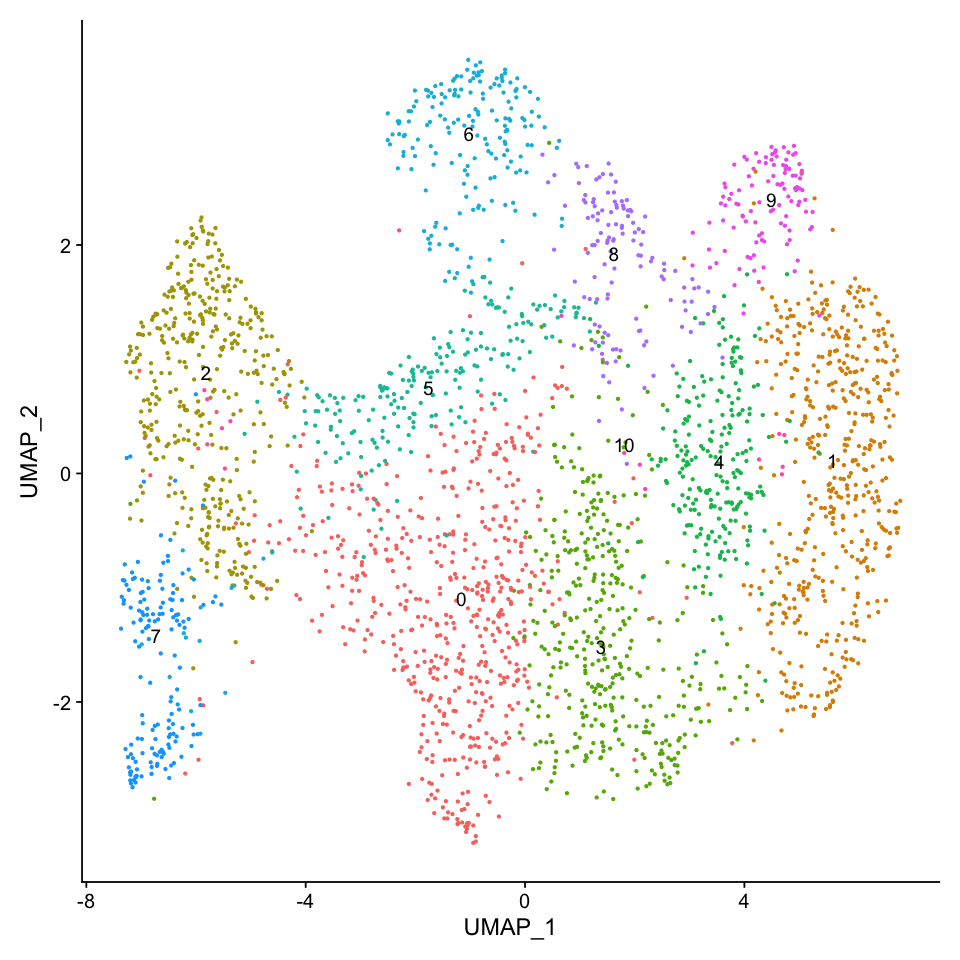

In [9]:
options(repr.plot.width=8, repr.plot.height=8)
seu.ecto <- RunPCA(seu.ecto)
seu.ecto <- RunUMAP(seu.ecto, dims = 1:30)
seu.ecto <- FindNeighbors(seu.ecto, dims = 1:30)
seu.ecto <- FindClusters(seu.ecto)
DimPlot(seu.ecto, reduction = 'umap', label = T) + NoLegend()

In [10]:
all.markers.ecto <- FindAllMarkers(object = seu.ecto, only.pos = TRUE)
nrow(all.markers.ecto)
all.markers.ecto.top10 <- all.markers.ecto %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.ecto.top10)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10



[1] 967

[1] 110

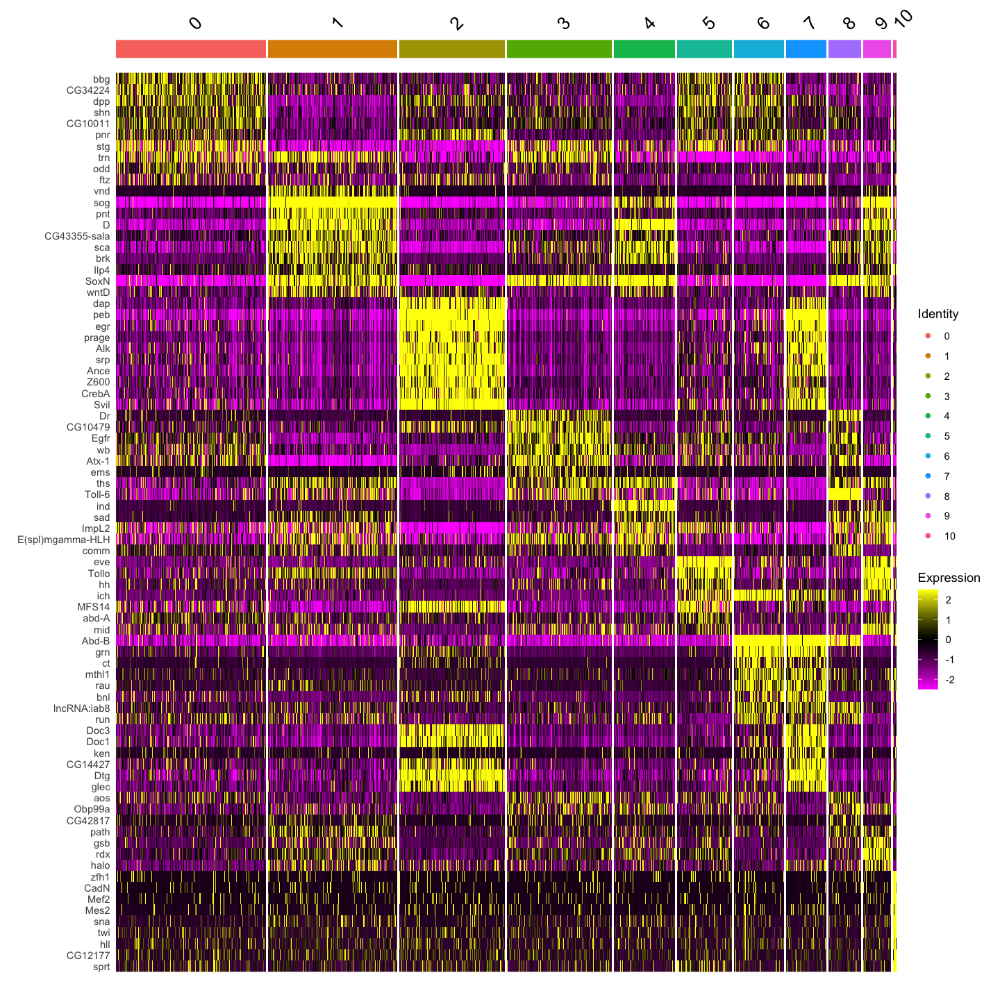

In [11]:
options(repr.plot.width=12, repr.plot.height=12)
DoHeatmap(seu.ecto, features = c(all.markers.ecto.top10$gene))

cluster 10 expressed mesoderm markers. (doublets)

## Remove doublets

In [12]:
seu.doublet <- subset(seu.ecto, idents = 10)
seu.doublet$manual_ID <- 'doublet'
seu.doublet
seu.ecto <- subset(seu.ecto, idents = 10, invert = T)
seu.ecto

An object of class Seurat 
27374 features across 15 samples within 2 assays 
Active assay: SCT (9870 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, tsne

An object of class Seurat 
27374 features across 2911 samples within 2 assays 
Active assay: SCT (9870 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, tsne

## Clustering again without doublets

PC_ 1 
Positive:  peb, mirr, CG45263, Svil, egr, Ance, tup, cv-2, Alk, Dtg 
	   srp, Doc1, dap, prage, Doc3, scyl, CrebA, MFS14, chrb, glec 
	   hbs, CG42342, Z600, emc, ush, kay, sas, rst, fj, bun 
Negative:  SoxN, sog, sca, ImpL2, D, ths, Toll-6, Tet, E(spl)mgamma-HLH, Cys 
	   trn, Dl, brk, CG43355-sala, hth, wb, Meltrin, slp1, Tollo, pri 
	   lncRNA:Hsromega, gsb, Obp99a, CG17724-Kdm4B-seq, Ocho, pros, robo2, stg, rdx, CG8654 
PC_ 2 
Positive:  sog, D, SoxN, pnt, sca, peb, vn, CG43355-sala, wntD, halo 
	   Cys, Ance, dap, brk, E(spl)mgamma-HLH, Doc3, esg, prage, glec, CG17724-Kdm4B-seq 
	   egr, gsb, vnd, Dtg, CrebA, CG13653, scyl, Ilp4, rho, sad 
Negative:  stg, Atx-1, dpp, bbg, shn, Egfr, aop, CG10011, aos, lncRNA:CR43887 
	   cic, wb, CG34224, Myc, cv-2, opa, pnr, zld, ich, Mkp3 
	   pri, wech, lncRNA:CR43432, RapGAP1, grh, Shroom, tsh, DNaseII, hth, fra 
PC_ 3 
Positive:  Abd-B, RpL27A, RpS4, CG10035, RpS15, Fer2LCH, eEF1alpha1, CG13427, Fer1HCH, Ama 
	   RpS20, tsr, RpL21, RpL

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 2911
Number of edges: 103121

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7592
Number of communities: 9
Elapsed time: 0 seconds


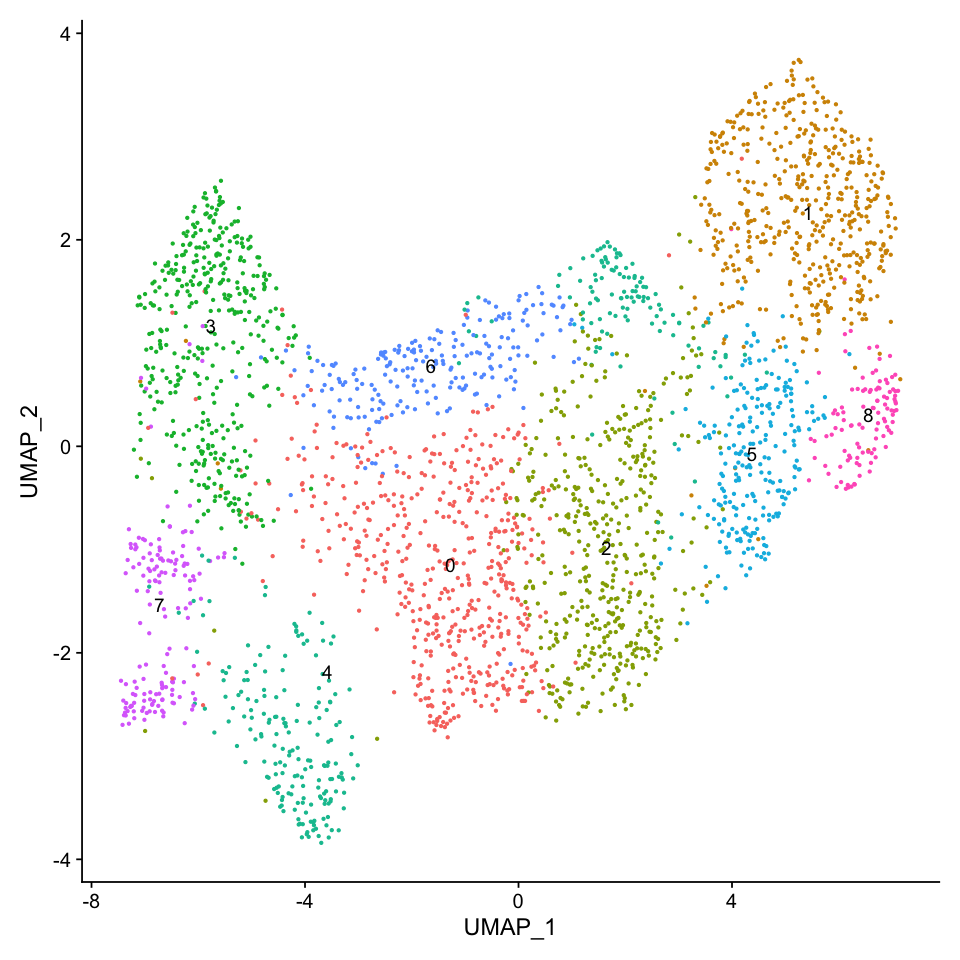

In [13]:
options(repr.plot.width=8, repr.plot.height=8)
seu.ecto <- RunPCA(seu.ecto)
seu.ecto <- RunUMAP(seu.ecto, dims = 1:30)
seu.ecto <- FindNeighbors(seu.ecto, dims = 1:30)
seu.ecto <- FindClusters(seu.ecto)
DimPlot(seu.ecto, reduction = 'umap', label = T) + NoLegend()

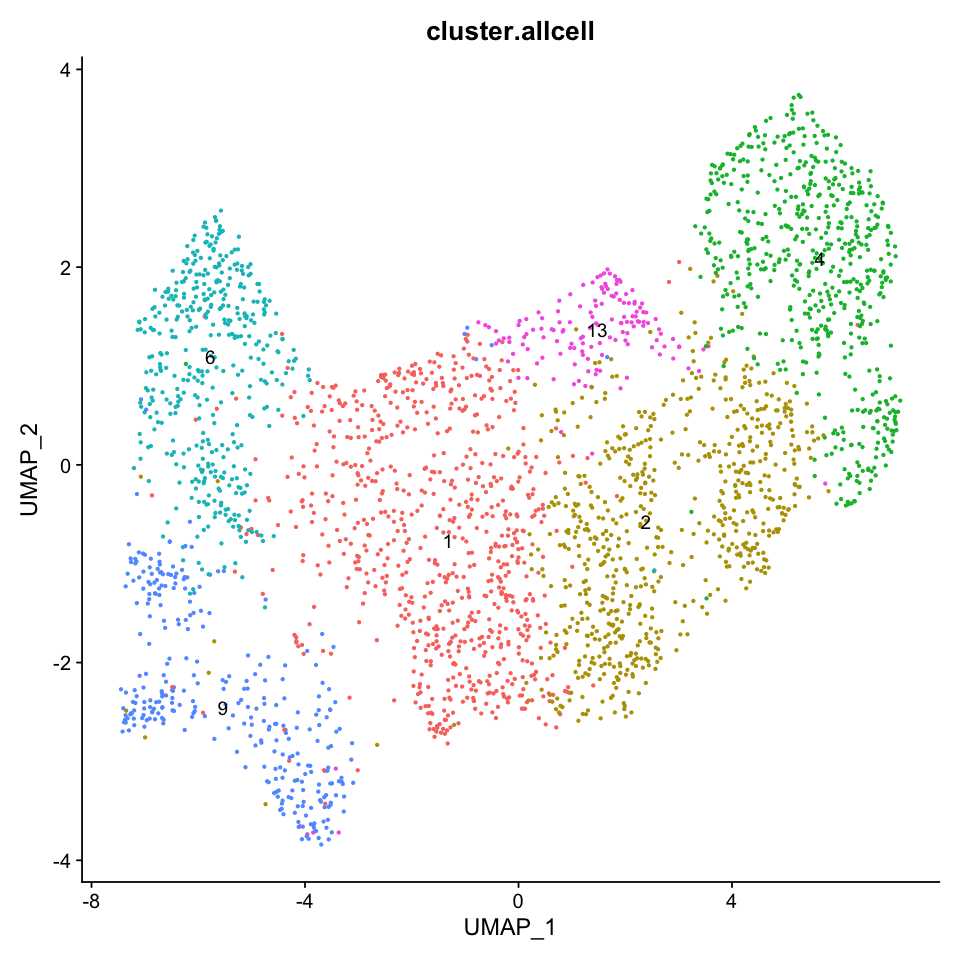

In [14]:
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu.ecto, reduction = 'umap', label = T, group.by = 'cluster.allcell') + NoLegend()

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 2911
Number of edges: 103121

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7342
Number of communities: 10
Elapsed time: 0 seconds


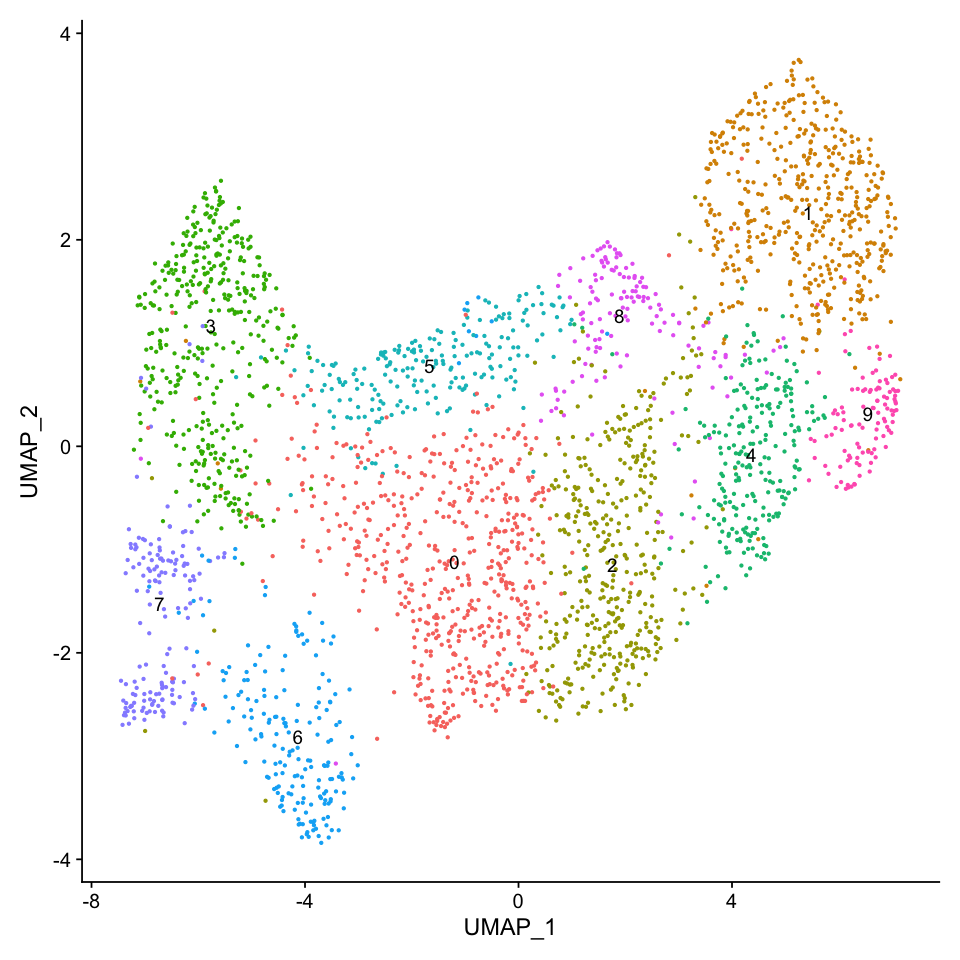

In [15]:
options(repr.plot.width=8, repr.plot.height=8)
seu.ecto <- FindClusters(seu.ecto, resolution = 1.0)
DimPlot(seu.ecto, reduction = 'umap', label = T) + NoLegend()

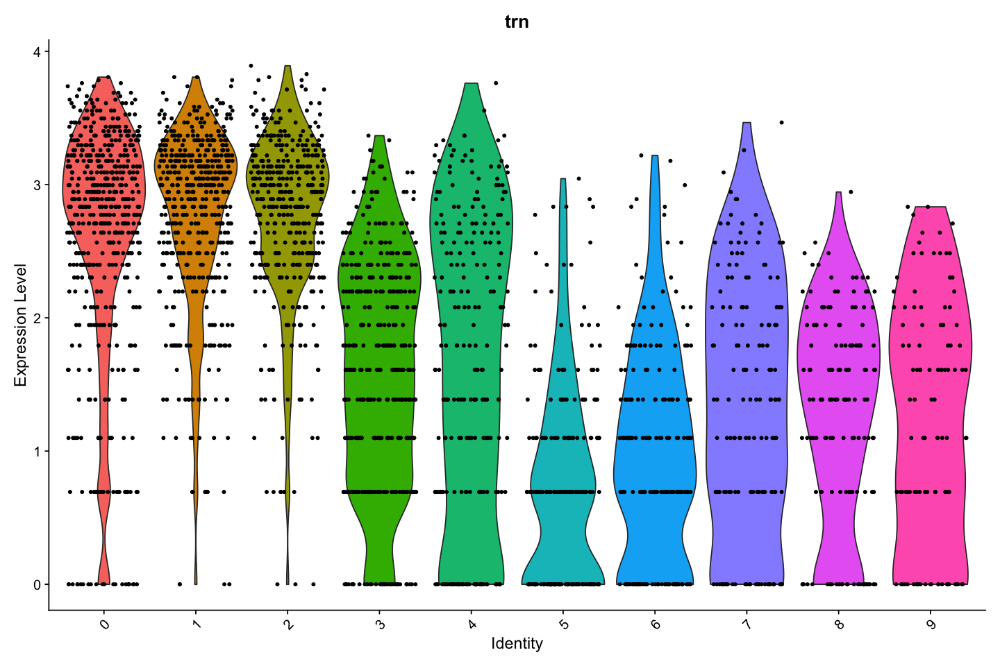

In [16]:
options(repr.plot.width=12, repr.plot.height=8)
VlnPlot(seu.ecto, features = 'trn') + NoLegend()

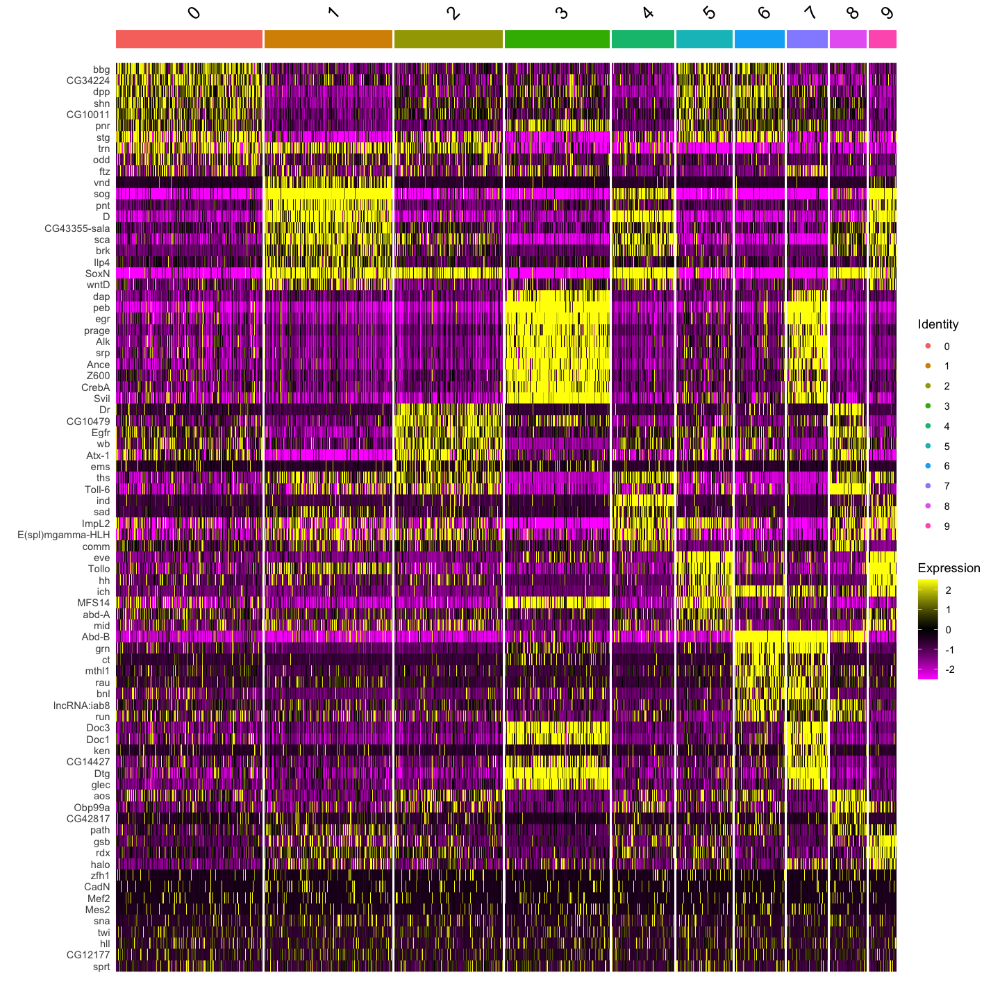

In [17]:
options(repr.plot.width=12, repr.plot.height=12)
DoHeatmap(seu.ecto, features = c(all.markers.ecto.top10$gene))

In [18]:
all.markers.ecto <- FindAllMarkers(object = seu.ecto, only.pos = TRUE)
nrow(all.markers.ecto)
all.markers.ecto.top10 <- all.markers.ecto %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.ecto.top10)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9



[1] 664

[1] 100

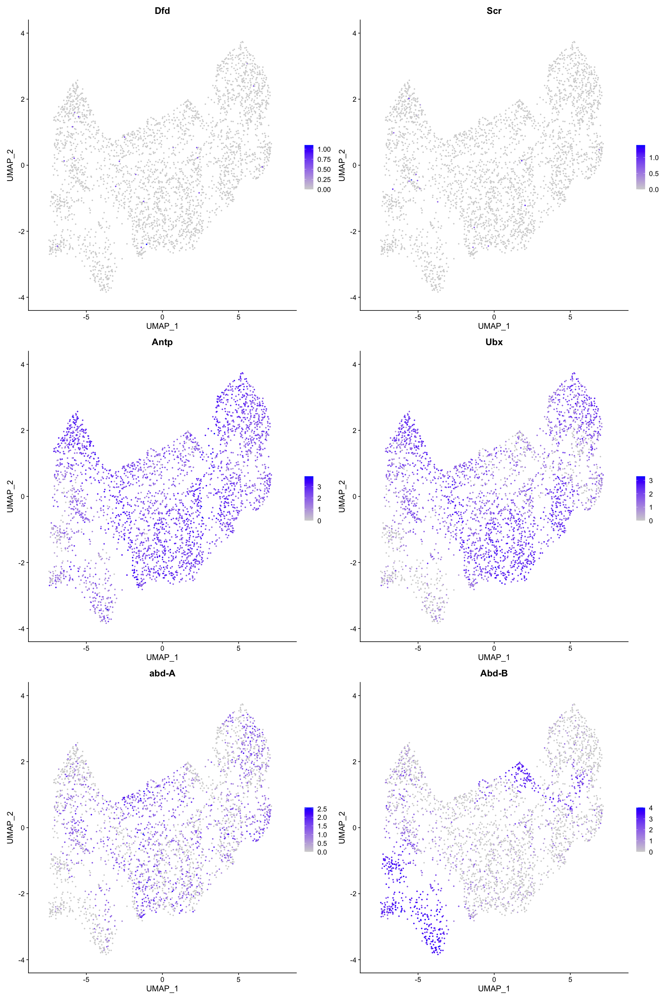

In [19]:
options(repr.plot.width=16, repr.plot.height=24)
FeaturePlot(seu.ecto, reduction = "umap", features = c('Dfd','Scr','Antp','Ubx','abd-A','Abd-B'),ncol = 2)

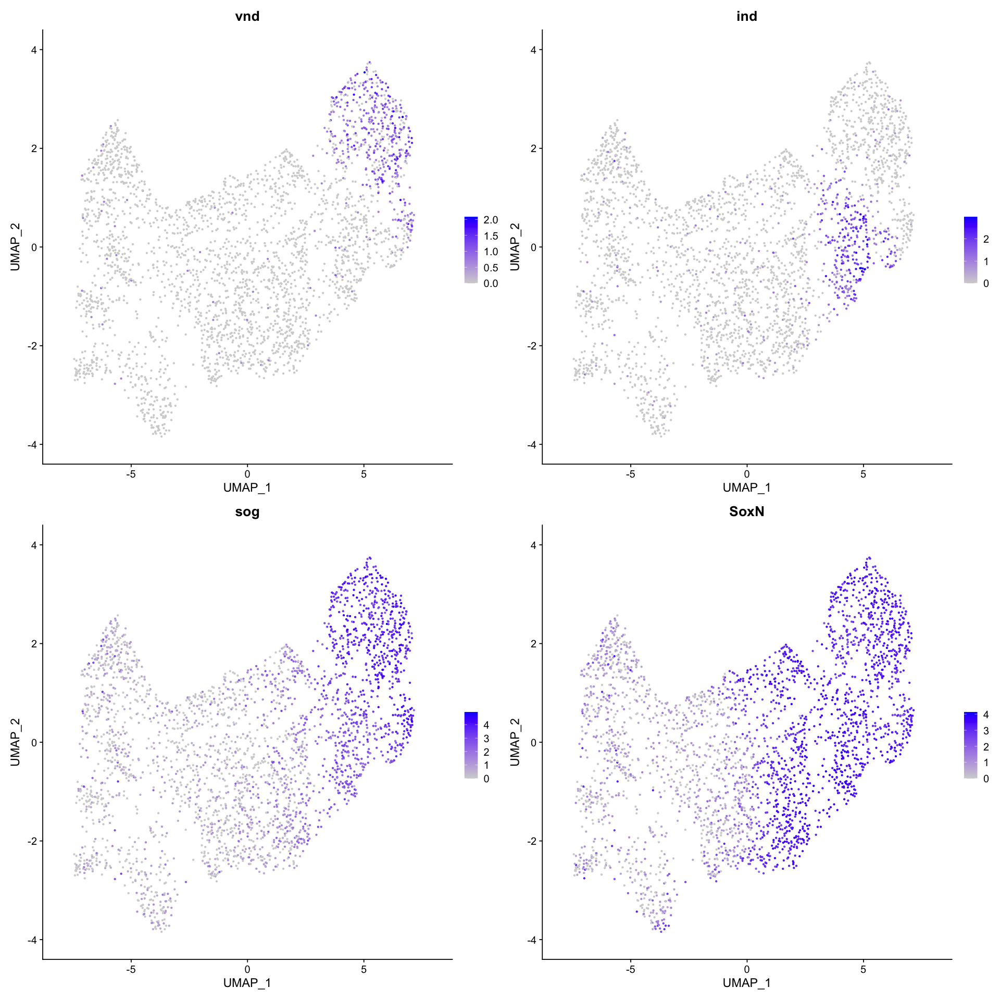

In [20]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu.ecto, reduction = "umap", features = c('vnd','ind','sog','SoxN'),ncol = 2)

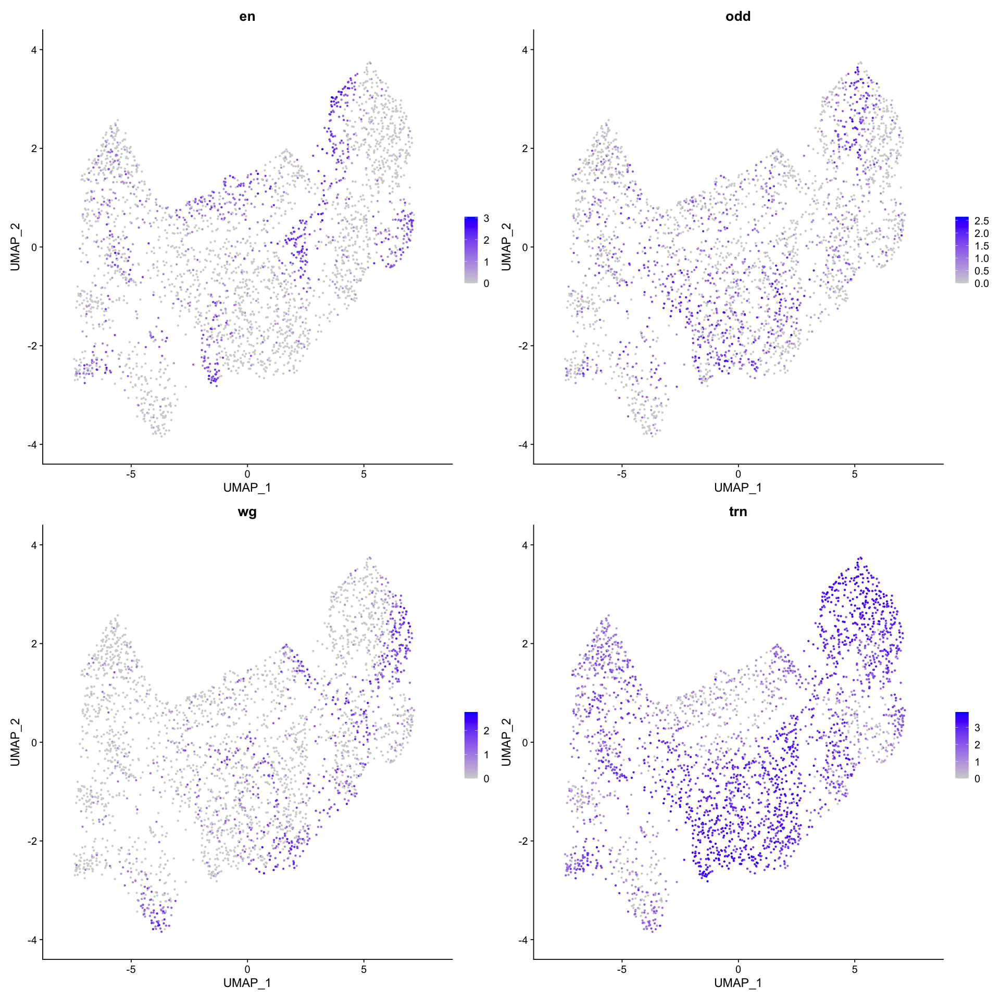

In [21]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu.ecto, reduction = "umap", features = c('en','odd','wg','trn'),ncol = 2)

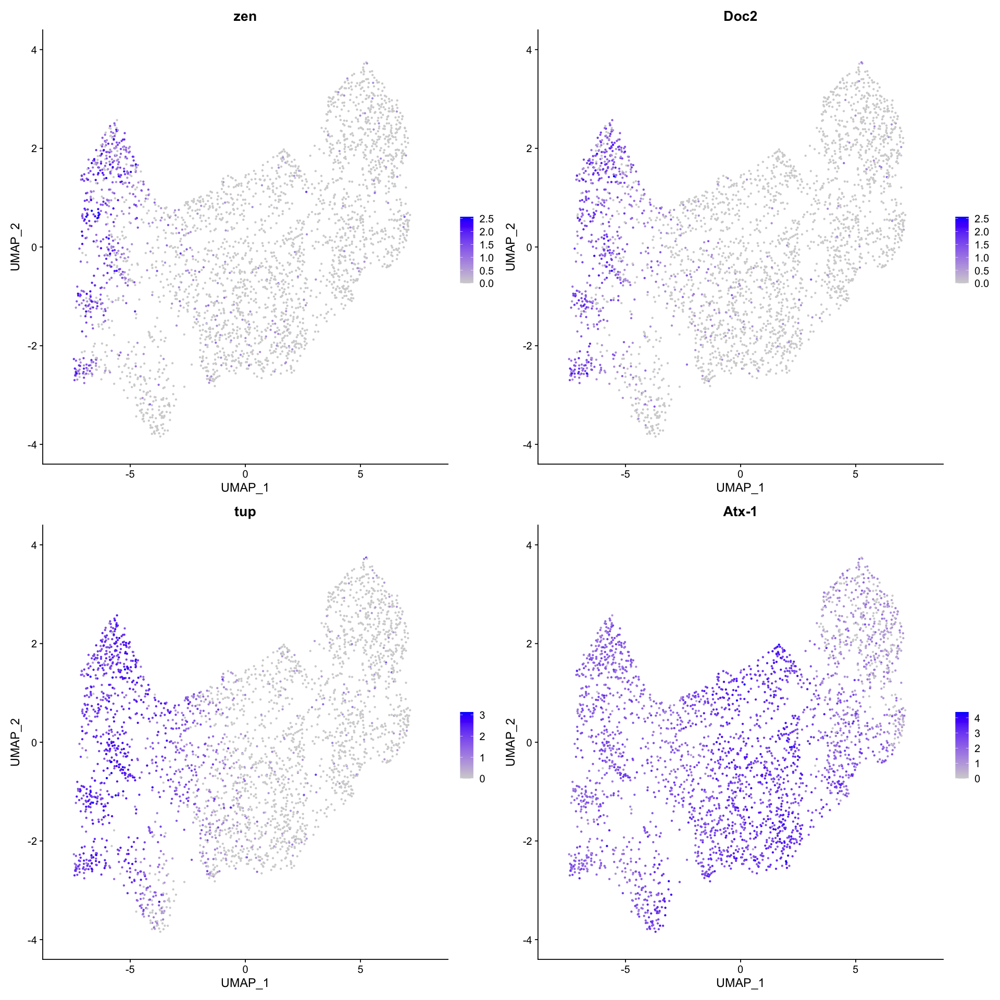

In [22]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu.ecto, reduction = "umap", features = c('zen','Doc2','tup','Atx-1'),ncol = 2)

## AP-annotation

,manual_ID
,<fct>
AAACCCACAAGACCTT,3
AAACCCACATGGAATA,2
AAACCCATCTGGGTCG,1
AAACGAAGTAGAGGAA,7
AAACGAAGTATCGTTG,7
AAACGCTAGCCAGACA,2


,manual_ID
,<fct>
AAACCCACAAGACCTT,amnioserosa
AAACCCACATGGAATA,abdominal_even
AAACCCATCTGGGTCG,abdominal
AAACGAAGTAGAGGAA,amnioserosa_PS13-14
AAACGAAGTATCGTTG,amnioserosa_PS13-14
AAACGCTAGCCAGACA,abdominal_even


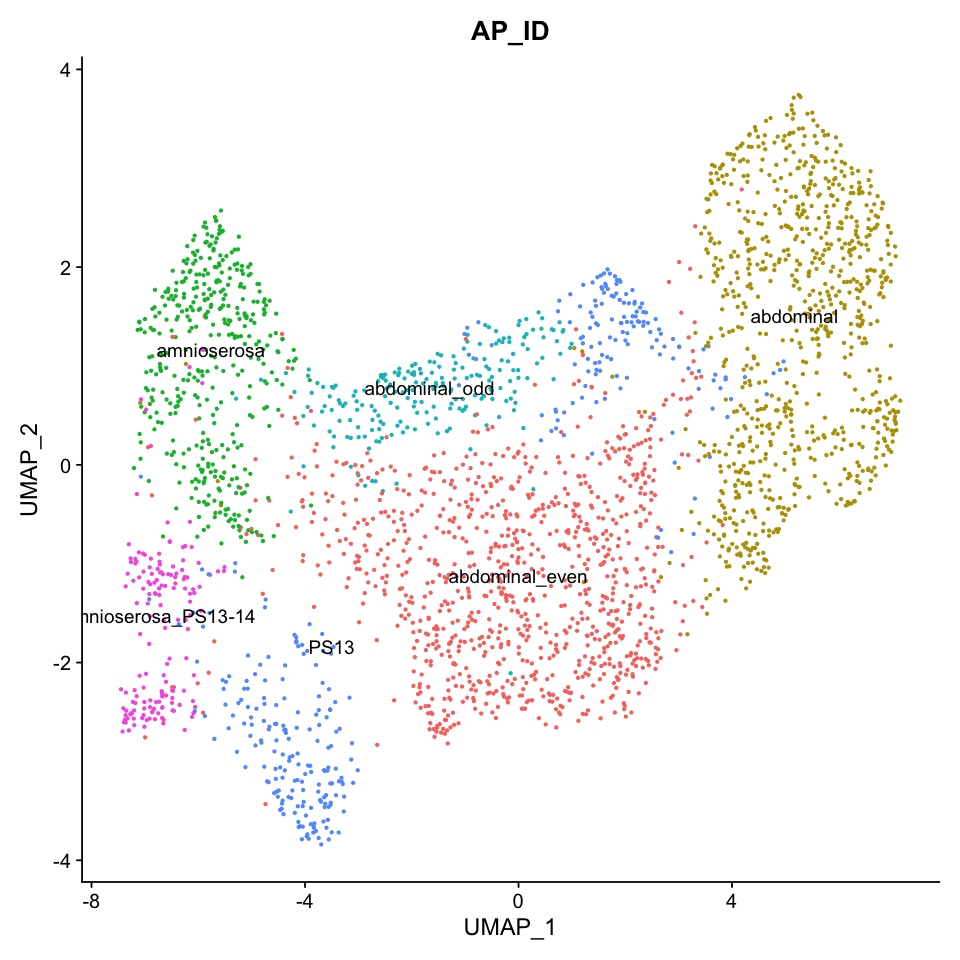

In [23]:
manual_id <- as.data.frame(seu.ecto$seurat_clusters)
colnames(manual_id) <- c('manual_ID')
head(manual_id)
manual_id$manual_ID = dplyr::recode(manual_id$manual_ID, 
                                     "0"="abdominal_even", 
                                     "1"="abdominal", 
                                     "2"="abdominal_even", 
                                     "3"="amnioserosa", 
                                     "4"="abdominal", 
                                     "5"="abdominal_odd",
                                     "6"="PS13",
                                     "7"="amnioserosa_PS13-14",
                                     "8"="PS13",
                                     "9"="abdominal",
                                   )
                                    

head(manual_id)
seu.ecto$AP_ID <- manual_id
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu.ecto, reduction = 'umap', label = T, group.by = 'AP_ID') + NoLegend() 

In [24]:
levels <- read.table(file="./lateral_ect_AP_levels_color.txt")
colors <- levels[,2]
levels <- levels[,1]
head(levels)
length(levels)
head(colors)

[1] "abdominal_odd"       "abdominal_even"      "abdominal"          
[4] "PS13"                "amnioserosa"         "amnioserosa_PS13-14"

[1] 6

[1] "plum3"         "olivedrab3"    "darkslateblue" "chartreuse4"  
[5] "gray75"        "gray50"

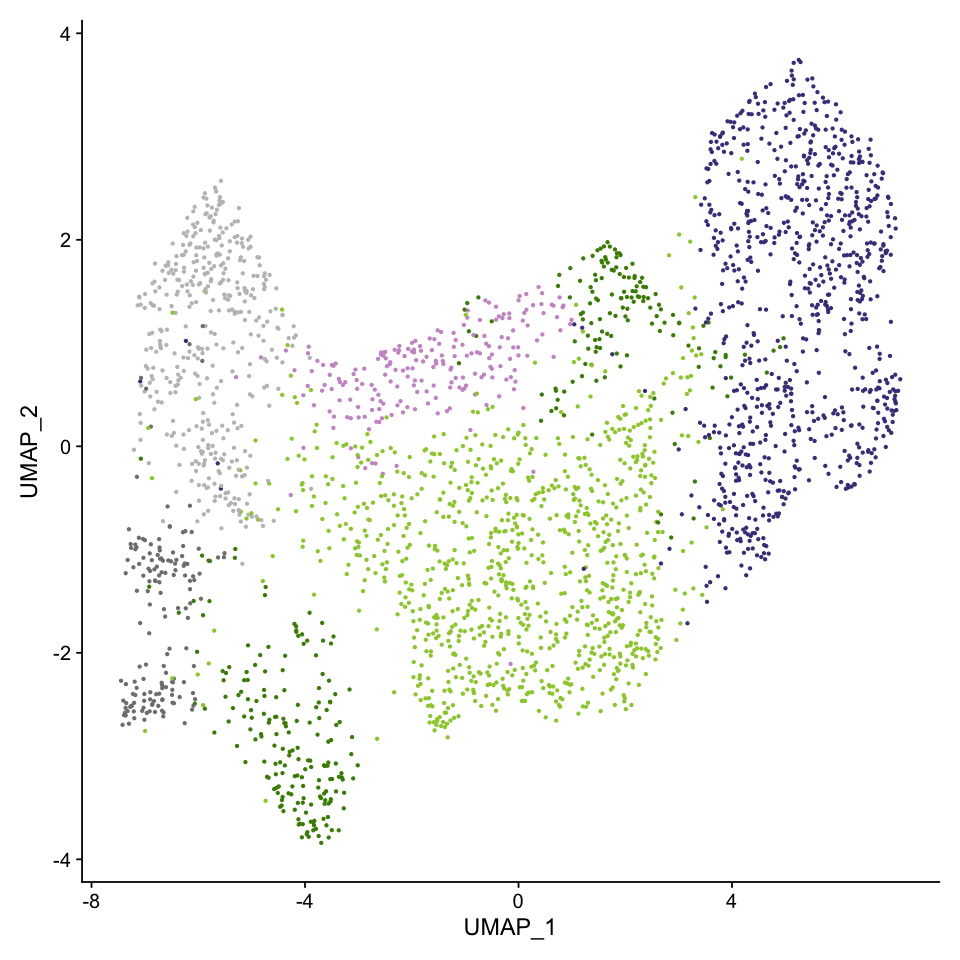

In [25]:
Idents(seu.ecto) <- 'AP_ID'
levels(seu.ecto) <- levels
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu.ecto, reduction =  "umap", label = FALSE, cols = colors) + NoLegend() 
fig
ggsave(fig, file = "./figures/03_lateral_ecto_subclustering_bcdRNAi/lateral_ecto_umap_AP_IDs.eps", dpi = 300, width =8, height = 8)

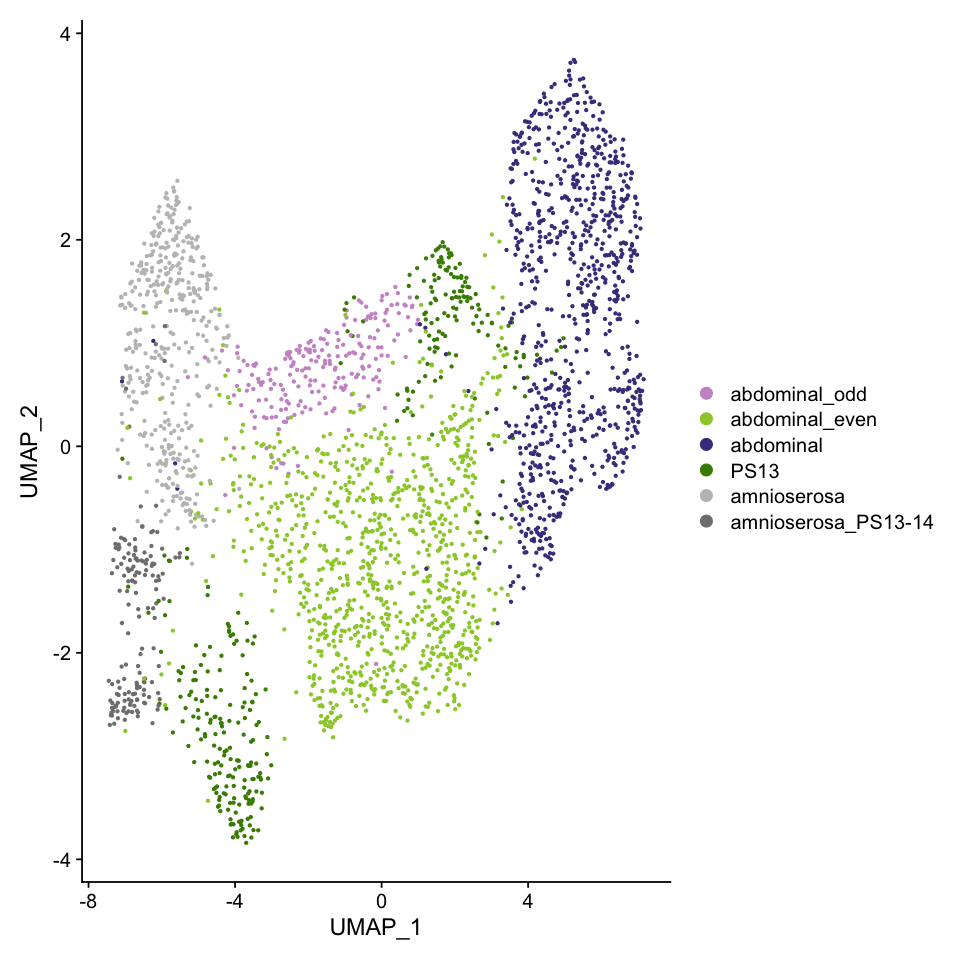

In [26]:
Idents(seu.ecto) <- 'AP_ID'
levels(seu.ecto) <- levels
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu.ecto, reduction =  "umap", label = FALSE, cols = colors)
fig
ggsave(fig, file = "./figures/03_lateral_ecto_subclustering_bcdRNAi/lateral_ecto_umap2_AP_IDs.eps", dpi = 300, width =8, height = 8)

## DV-annotation

In [27]:
DV_genes <- c("rho", "vnd", "pnt", "ind", "sog", "SoxN", "brk", "dpp", "Egfr", "vn", "pnt",
              "Atx-1", "egr", "cv-2", "Doc1", "Ance", "Dr", "emc", "cic",
              "mirr", "ush", "Ama", "bbg", "tup", "zen", "Doc2", "Z600", "C15", "peb",
             "Dtg", "CG13653", "Doc3", "dap","srp", "stg")

In [28]:
norm.count.ecto <- GetAssayData(seu.ecto)
norm.count.ecto.dv.genes <- as.matrix(norm.count.ecto[DV_genes,])
head(norm.count.ecto.dv.genes)

,AAACCCACAAGACCTT,AAACCCACATGGAATA,AAACCCATCTGGGTCG,AAACGAAGTAGAGGAA,AAACGAAGTATCGTTG,AAACGCTAGCCAGACA,AAACGCTCAAACGAGC,AAACGCTCACTTTATC,AAACGCTTCCCAGGCA,AAAGAACAGTCCCAGC,⋯,TTTGATCAGCTGTCCG,TTTGATCCATAACCCA,TTTGGAGAGCAGCAGT,TTTGGAGAGCAGGCTA,TTTGGAGCAGGCGTTC,TTTGGTTCACGTAGAG,TTTGGTTTCCTCTCTT,TTTGTTGCATGCGTGC,TTTGTTGGTAGAGTTA,TTTGTTGGTCCGTACG
rho,1.791759,0.000000,2.397895,2.9957323,2.484907,0.6931472,0.6931472,0.000000,0.6931472,0.6931472,⋯,0.6931472,0.000000,1.0986123,0.000000,0.0000000,0.0000000,0.000000,3.1780538,0.0000000,2.1972246
vnd,0.000000,0.000000,1.386294,0.0000000,0.000000,0.0000000,0.0000000,0.000000,0.0000000,0.0000000,⋯,0.0000000,0.000000,0.0000000,0.000000,0.0000000,0.0000000,0.000000,0.0000000,0.0000000,0.0000000
pnt,1.791759,0.000000,1.945910,0.0000000,0.000000,0.0000000,0.6931472,0.000000,0.6931472,0.0000000,⋯,0.6931472,0.000000,0.0000000,1.386294,1.0986123,0.6931472,2.079442,0.6931472,0.0000000,0.6931472
ind,0.000000,0.000000,0.000000,0.0000000,0.000000,0.0000000,0.0000000,0.000000,0.0000000,1.0986123,⋯,0.6931472,0.000000,0.0000000,1.386294,0.0000000,0.0000000,0.000000,0.0000000,0.0000000,0.0000000
sog,0.000000,1.791759,3.610918,0.0000000,0.000000,1.7917595,0.0000000,0.000000,1.6094379,3.0445224,⋯,3.4965076,2.197225,0.0000000,2.564949,0.6931472,0.0000000,3.555348,0.0000000,0.6931472,1.0986123
SoxN,0.000000,3.526361,2.995732,0.6931472,0.000000,3.5835189,2.3025851,2.995732,3.1354942,3.5835189,⋯,3.4011974,3.663562,0.6931472,3.555348,1.7917595,2.6390573,2.995732,0.0000000,1.0986123,0.6931472


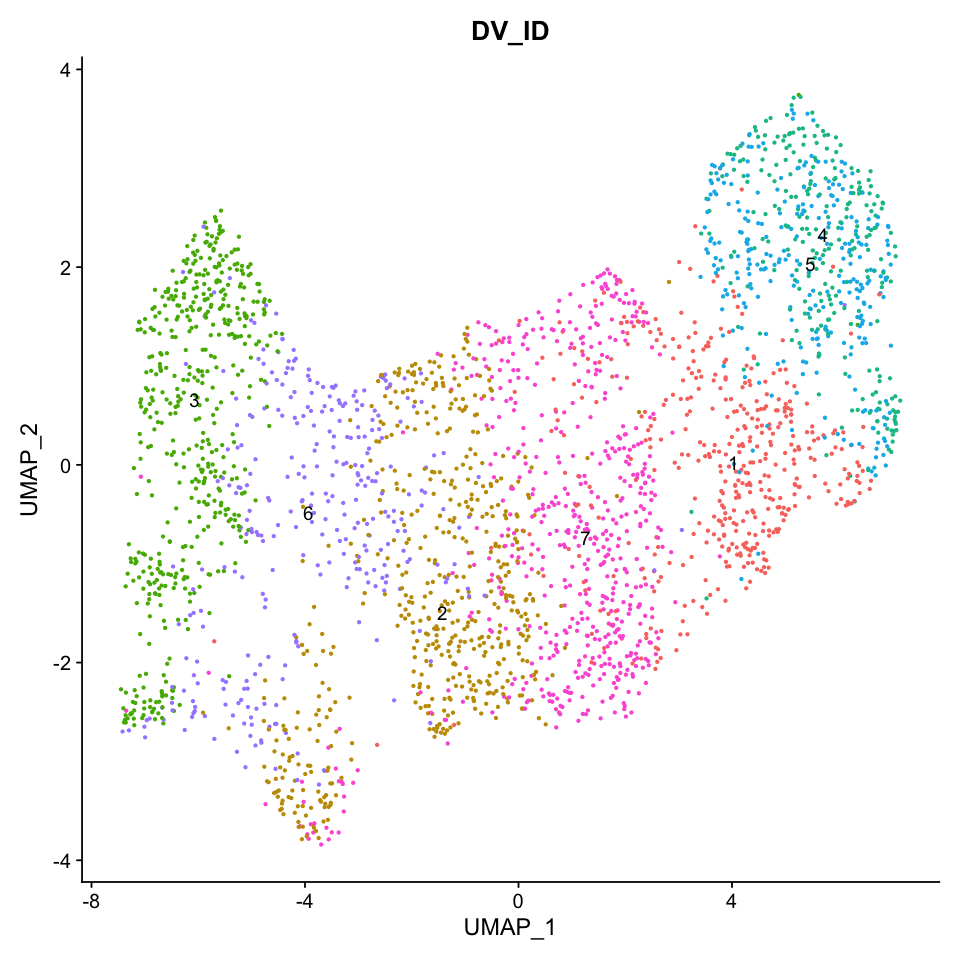

In [29]:
set.seed(0)
trunk_ect_DV_cluster <- kmeans(x=t(norm.count.ecto.dv.genes), centers=7)
seu.ecto$DV_ID <- trunk_ect_DV_cluster$cluster
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu.ecto, reduction = 'umap', group.by = 'DV_ID',label = TRUE) + NoLegend()

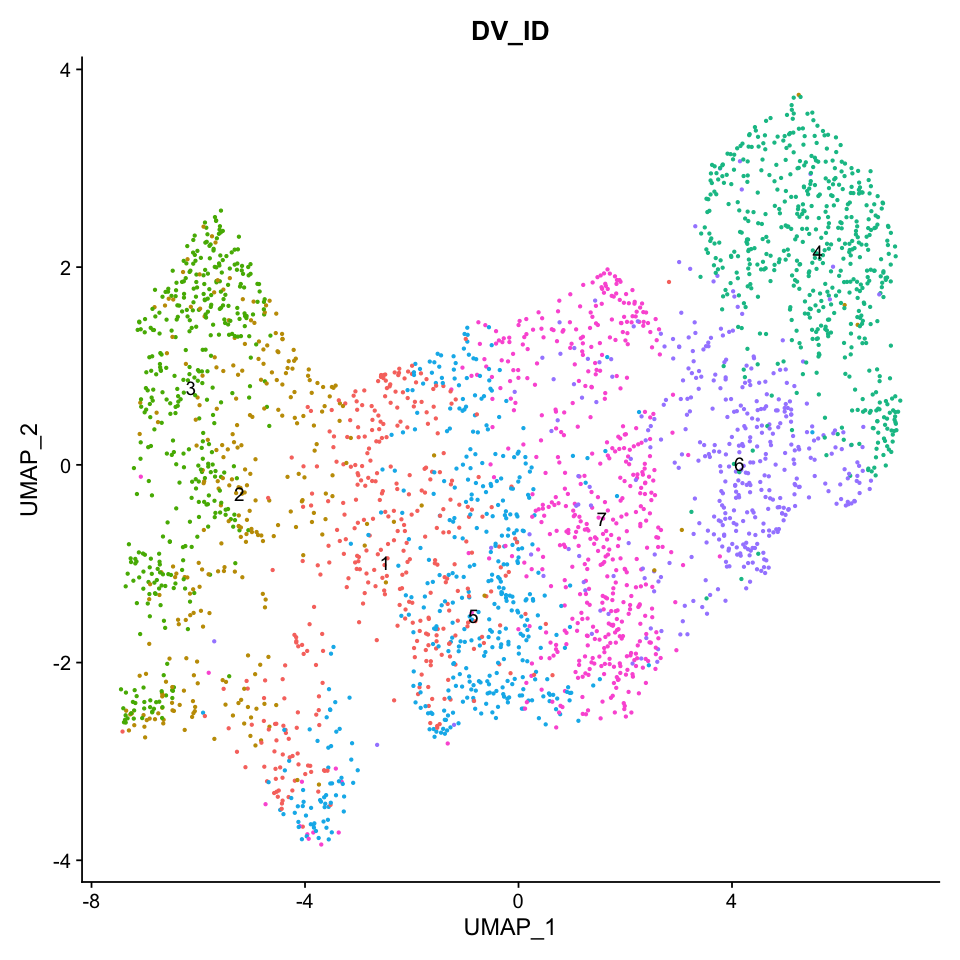

In [30]:
set.seed(3)
trunk_ect_DV_cluster <- kmeans(x=t(norm.count.ecto.dv.genes), centers=7)
seu.ecto$DV_ID <- trunk_ect_DV_cluster$cluster
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu.ecto, reduction = 'umap', group.by = 'DV_ID',label = TRUE) + NoLegend()

In [31]:
Idents(seu.ecto) <- 'DV_ID'
levels(seu.ecto) <- c(4,6,7,5,1,2,3)
all.markers.ecto <- FindAllMarkers(object = seu.ecto, only.pos = TRUE)
nrow(all.markers.ecto)
all.markers.ecto.top10 <- all.markers.ecto %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.ecto.top10)

Calculating cluster 4

Calculating cluster 6

Calculating cluster 7

Calculating cluster 5

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3



[1] 477

[1] 70

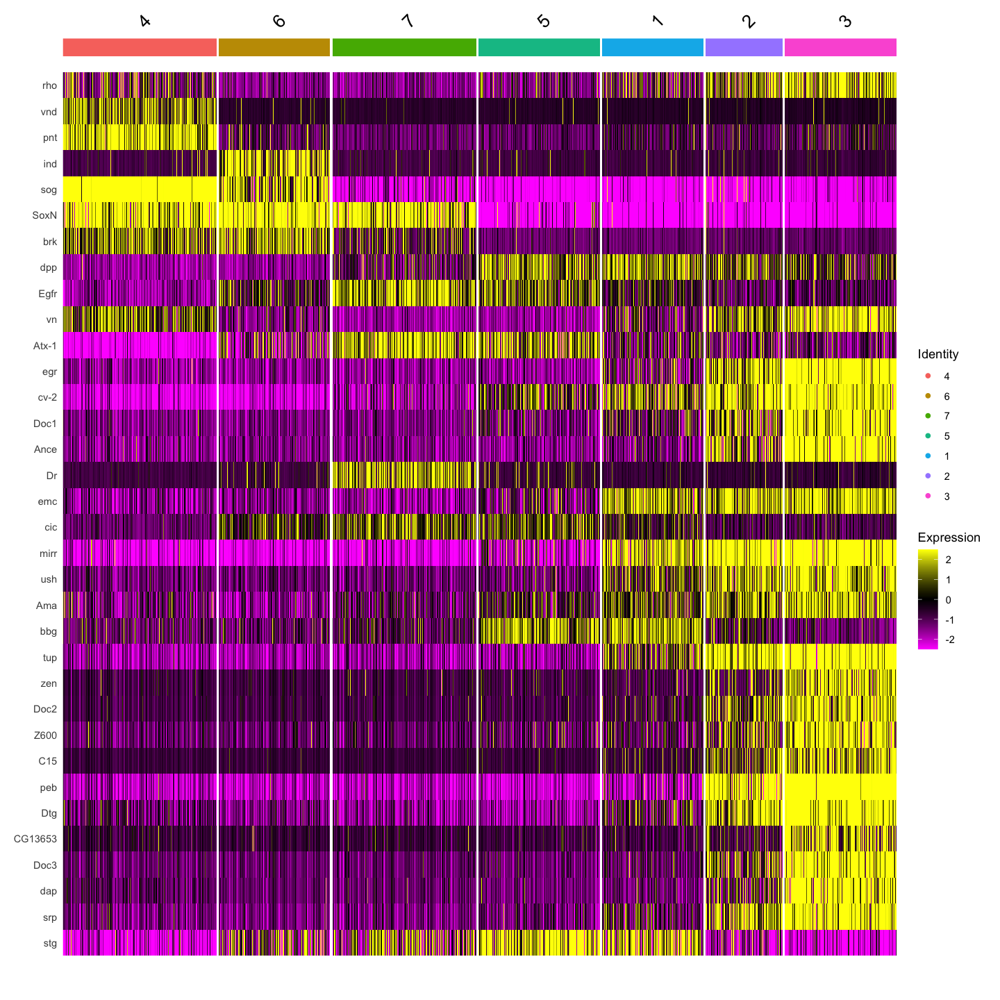

In [32]:
options(repr.plot.width=12, repr.plot.height=12)
DoHeatmap(seu.ecto, features = DV_genes)

,manual_ID
,<int>
AAACCCACAAGACCTT,3
AAACCCACATGGAATA,7
AAACCCATCTGGGTCG,2
AAACGAAGTAGAGGAA,3
AAACGAAGTATCGTTG,3
AAACGCTAGCCAGACA,7


,manual_ID
,<chr>
AAACCCACAAGACCTT,amnioserosa
AAACCCACATGGAATA,ectoderm_lateral_NE
AAACCCATCTGGGTCG,ectoderm_medial_DE
AAACGAAGTAGAGGAA,amnioserosa
AAACGAAGTATCGTTG,amnioserosa
AAACGCTAGCCAGACA,ectoderm_lateral_NE


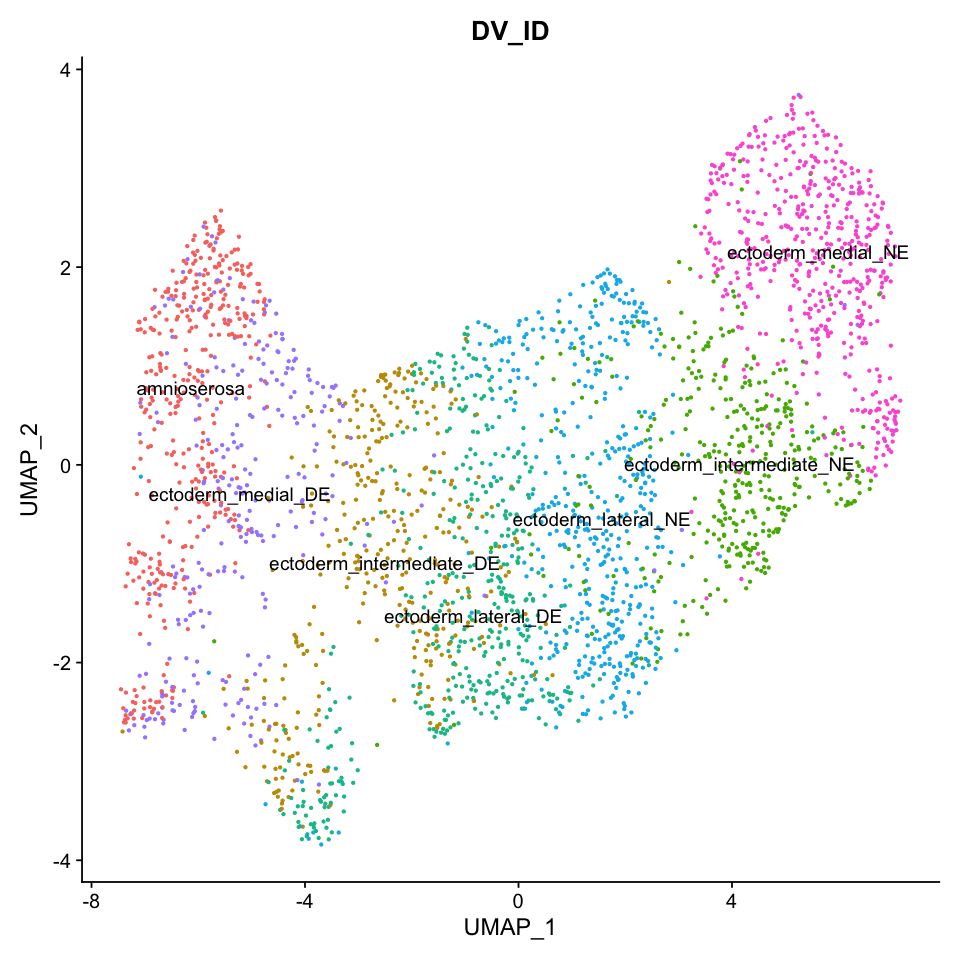

In [33]:
manual_id <- as.data.frame(seu.ecto$DV_ID)
colnames(manual_id) <- c('manual_ID')
head(manual_id)
manual_id$manual_ID = dplyr::recode(manual_id$manual_ID, 
                                     "4"="ectoderm_medial_NE", 
                                     "6"="ectoderm_intermediate_NE", 
                                     "7"="ectoderm_lateral_NE", 
                                     "5"="ectoderm_lateral_DE", 
                                     "1"="ectoderm_intermediate_DE", 
                                     "2"="ectoderm_medial_DE",
                                     "3"="amnioserosa",
                                   )
                                    

head(manual_id)
seu.ecto$DV_ID <- manual_id
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu.ecto, reduction = 'umap', label = T, group.by = 'DV_ID') + NoLegend() 

[1] "ectoderm_medial_DE"       "ectoderm_intermediate_DE"
[3] "ectoderm_lateral_DE"      "ectoderm_lateral_NE"     
[5] "ectoderm_intermediate_NE" "ectoderm_medial_NE"

[1] 7

[1] "skyblue3"   "olivedrab2" "olivedrab4" "goldenrod3" "plum1"     
[6] "plum4"

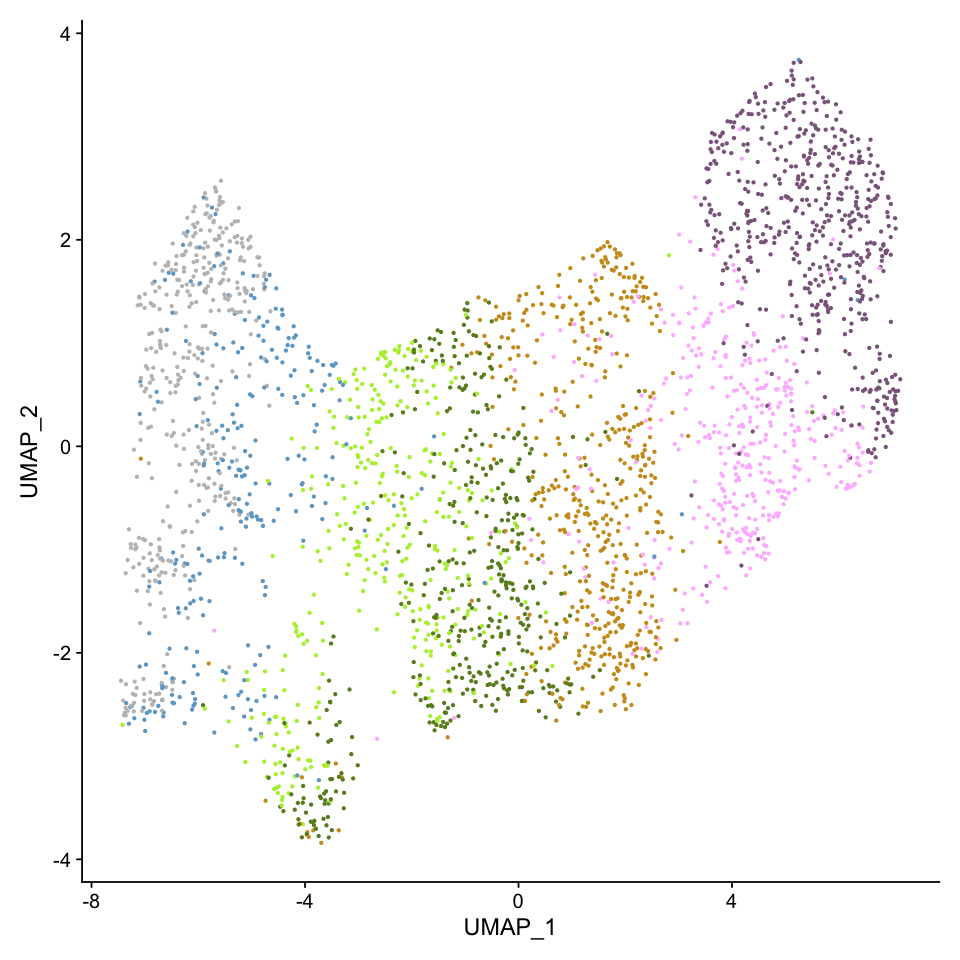

In [34]:
levels <- read.table(file="./lateral_ect_DV_levels_color.txt")
colors <- levels[,2]
levels <- levels[,1]
head(levels)
length(levels)
head(colors)

Idents(seu.ecto) <- 'DV_ID'
levels(seu.ecto) <- levels
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu.ecto, reduction =  "umap", label = FALSE, cols = colors) + NoLegend() 
fig
ggsave(fig, file = "./figures/03_lateral_ecto_subclustering_bcdRNAi/lateral_ecto_umap_DV_IDs.eps", dpi = 300, width =8, height = 8)

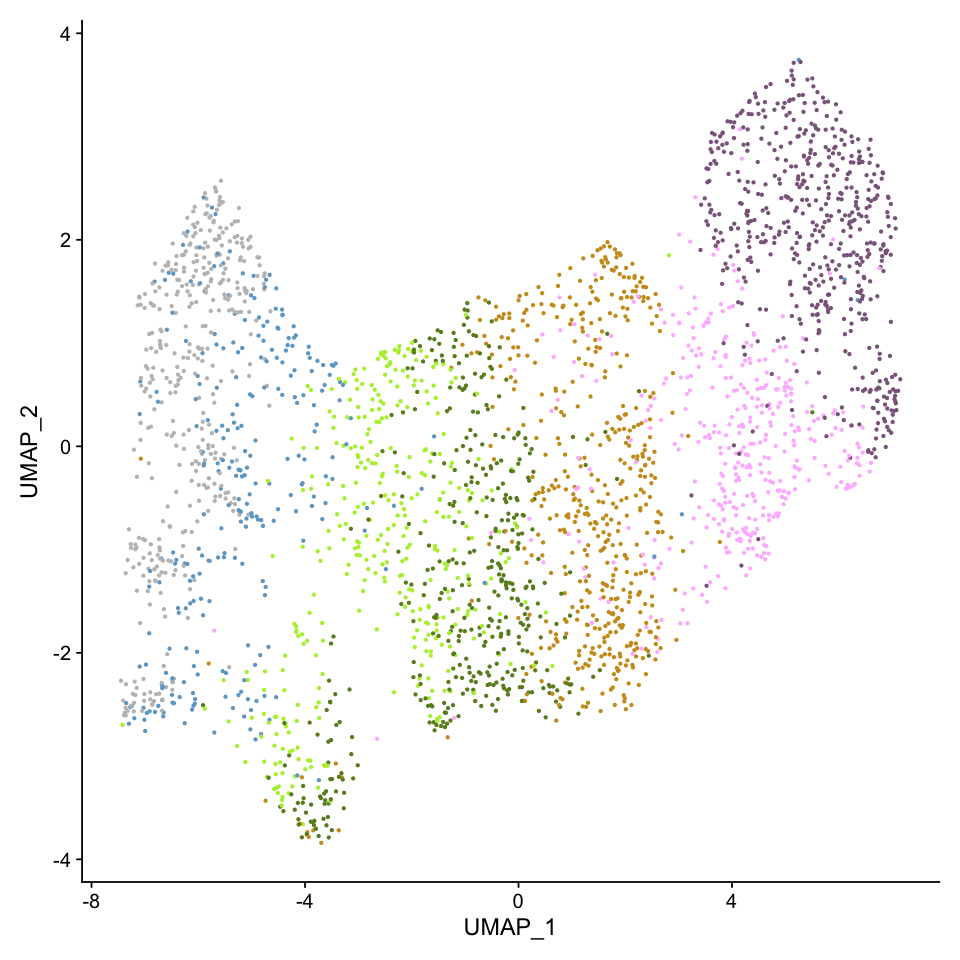

In [35]:
Idents(seu.ecto) <- 'DV_ID'
levels(seu.ecto) <- levels
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu.ecto, reduction =  "umap", label = FALSE, cols = colors) + NoLegend() 
fig
ggsave(fig, file = "./figures/03_lateral_ecto_subclustering_bcdRNAi/lateral_ecto_umap2_DV_IDs.eps", dpi = 300, width =8, height = 8)

## Merge AP and DV annotations

In [36]:
table(seu.ecto@meta.data[c('DV_ID','AP_ID')])

                          AP_ID
DV_ID                      abdominal_even abdominal amnioserosa abdominal_odd
  amnioserosa                           2         0         292             0
  ectoderm_intermediate_DE            199         0           2            83
  ectoderm_intermediate_NE             72       281           0             5
  ectoderm_lateral_DE                 306         1           0            54
  ectoderm_lateral_NE                 347         3           0            49
  ectoderm_medial_DE                   47         8         106            22
  ectoderm_medial_NE                    1       542           0             0
                          AP_ID
DV_ID                      PS13 amnioserosa_PS13-14
  amnioserosa                 2                 102
  ectoderm_intermediate_DE   74                   1
  ectoderm_intermediate_NE   37                   0
  ectoderm_lateral_DE        71                   0
  ectoderm_lateral_NE       111                   0


Only few ectoderm_medial_NE_PS13 means PS13 was not separated by clustering on the medial neuroectoderm.

In [37]:
merged.id <- as.data.frame(paste(seu.ecto$DV_ID, seu.ecto$AP_ID,sep = '_'))
colnames(merged.id) <- c('manual_ID')
row.names(merged.id) <- colnames(seu.ecto)
head(merged.id)

,manual_ID
,<chr>
AAACCCACAAGACCTT,amnioserosa_amnioserosa
AAACCCACATGGAATA,ectoderm_lateral_NE_abdominal_even
AAACCCATCTGGGTCG,ectoderm_medial_DE_abdominal
AAACGAAGTAGAGGAA,amnioserosa_amnioserosa_PS13-14
AAACGAAGTATCGTTG,amnioserosa_amnioserosa_PS13-14
AAACGCTAGCCAGACA,ectoderm_lateral_NE_abdominal_even


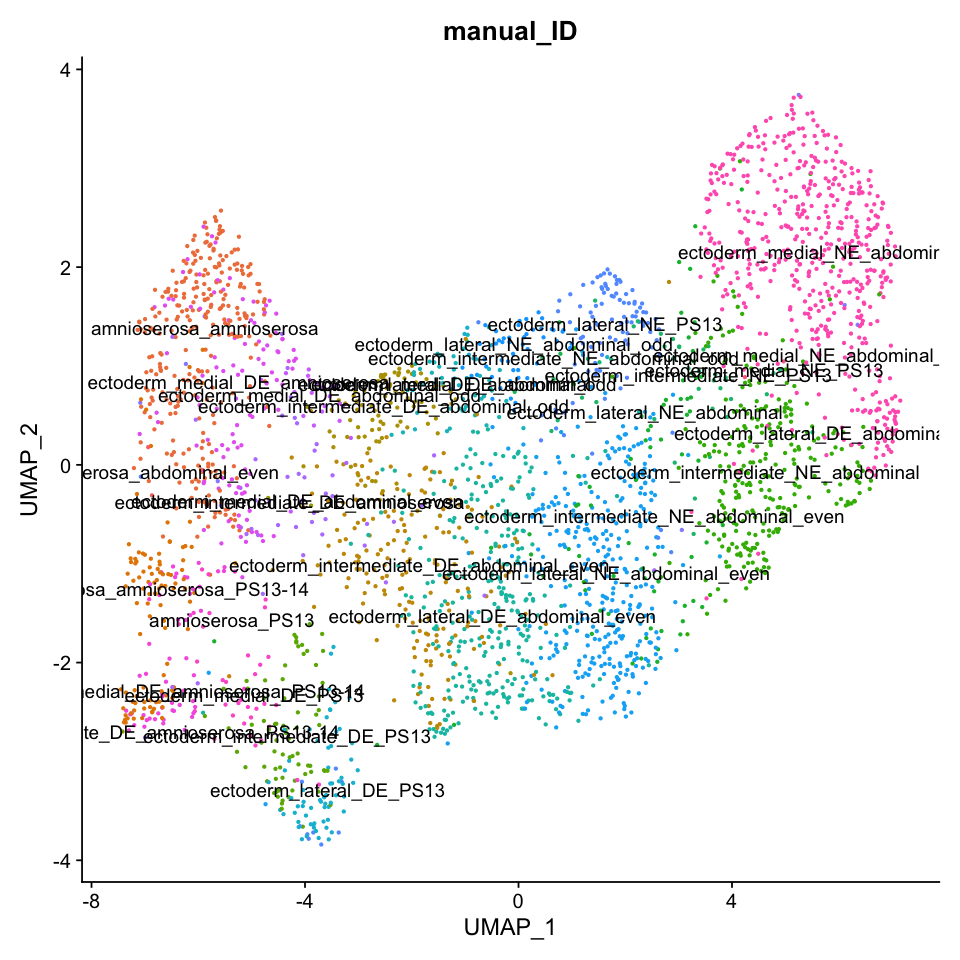

In [38]:
seu.ecto$manual_ID <- merged.id$manual_ID
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu.ecto, reduction = 'umap', group.by = 'manual_ID',label = TRUE) + NoLegend()

In [39]:
unique(seu.ecto$manual_ID)

[1] "amnioserosa_amnioserosa"                     
 [2] "ectoderm_lateral_NE_abdominal_even"          
 [3] "ectoderm_medial_DE_abdominal"                
 [4] "amnioserosa_amnioserosa_PS13-14"             
 [5] "ectoderm_lateral_DE_abdominal_even"          
 [6] "ectoderm_lateral_NE_abdominal_odd"           
 [7] "ectoderm_intermediate_NE_abdominal"          
 [8] "ectoderm_lateral_NE_PS13"                    
 [9] "ectoderm_lateral_DE_abdominal_odd"           
[10] "ectoderm_medial_NE_abdominal"                
[11] "ectoderm_intermediate_DE_abdominal_even"     
[12] "ectoderm_medial_DE_abdominal_odd"            
[13] "ectoderm_intermediate_DE_abdominal_odd"      
[14] "ectoderm_intermediate_NE_PS13"               
[15] "ectoderm_medial_DE_amnioserosa"              
[16] "ectoderm_intermediate_NE_abdominal_even"     
[17] "ectoderm_intermediate_DE_PS13"               
[18] "ectoderm_medial_DE_amnioserosa_PS13-14"      
[19] "ectoderm_medial_DE_abdominal_even"           
[20] "ectoderm_lateral_DE_PS13"                    
[21] "ectoderm_lateral_NE_abdominal"               
[22] "ectoderm_intermediate_NE_abdominal_odd"      
[23] "ectoderm_medial_DE_PS13"                     
[24] "ectoderm_medial_NE_abdominal_even"           
[25] "ectoderm_intermediate_DE_amnioserosa_PS13-14"
[26] "ectoderm_medial_NE_PS13"                     
[27] "amnioserosa_abdominal_even"                  
[28] "ectoderm_intermediate_DE_amnioserosa"        
[29] "ectoderm_lateral_DE_abdominal"               
[30] "amnioserosa_PS13"

In [40]:
merged.id$manual_ID <- gsub('^amnioserosa_PS13$','amnioserosa_PS13-14', merged.id$manual_ID)
merged.id$manual_ID <- gsub('^ectoderm_medial_DE_amnioserosa_PS13-14$','amnioserosa_PS13-14', merged.id$manual_ID)
merged.id$manual_ID <- gsub('^ectoderm_intermediate_DE_amnioserosa_PS13-14$','amnioserosa_PS13-14', merged.id$manual_ID)
merged.id$manual_ID <- gsub('^amnioserosa_amnioserosa_PS13-14$$','amnioserosa_PS13-14', merged.id$manual_ID)

merged.id$manual_ID <- gsub('^amnioserosa_amnioserosa$','amnioserosa_trunk', merged.id$manual_ID)
merged.id$manual_ID <- gsub('^amnioserosa_abdominal_odd$','amnioserosa_trunk', merged.id$manual_ID)
merged.id$manual_ID <- gsub('^amnioserosa_abdominal_even$','amnioserosa_trunk', merged.id$manual_ID)
merged.id$manual_ID <- gsub('^amnioserosa_abdominal$','amnioserosa_trunk', merged.id$manual_ID)
merged.id$manual_ID <- gsub('^ectoderm_medial_DE_amnioserosa$','amnioserosa_trunk', merged.id$manual_ID)
merged.id$manual_ID <- gsub('^ectoderm_intermediate_DE_amnioserosa$','amnioserosa_trunk', merged.id$manual_ID)

merged.id$manual_ID <- gsub('PS13$','abdominal', merged.id$manual_ID)
merged.id$manual_ID <- gsub('abdominal_odd','abdominal', merged.id$manual_ID)
merged.id$manual_ID <- gsub('abdominal_even','abdominal', merged.id$manual_ID)

unique(merged.id$manual_ID)

[1] "amnioserosa_trunk"                  "ectoderm_lateral_NE_abdominal"     
[3] "ectoderm_medial_DE_abdominal"       "amnioserosa_PS13-14"               
[5] "ectoderm_lateral_DE_abdominal"      "ectoderm_intermediate_NE_abdominal"
[7] "ectoderm_medial_NE_abdominal"       "ectoderm_intermediate_DE_abdominal"

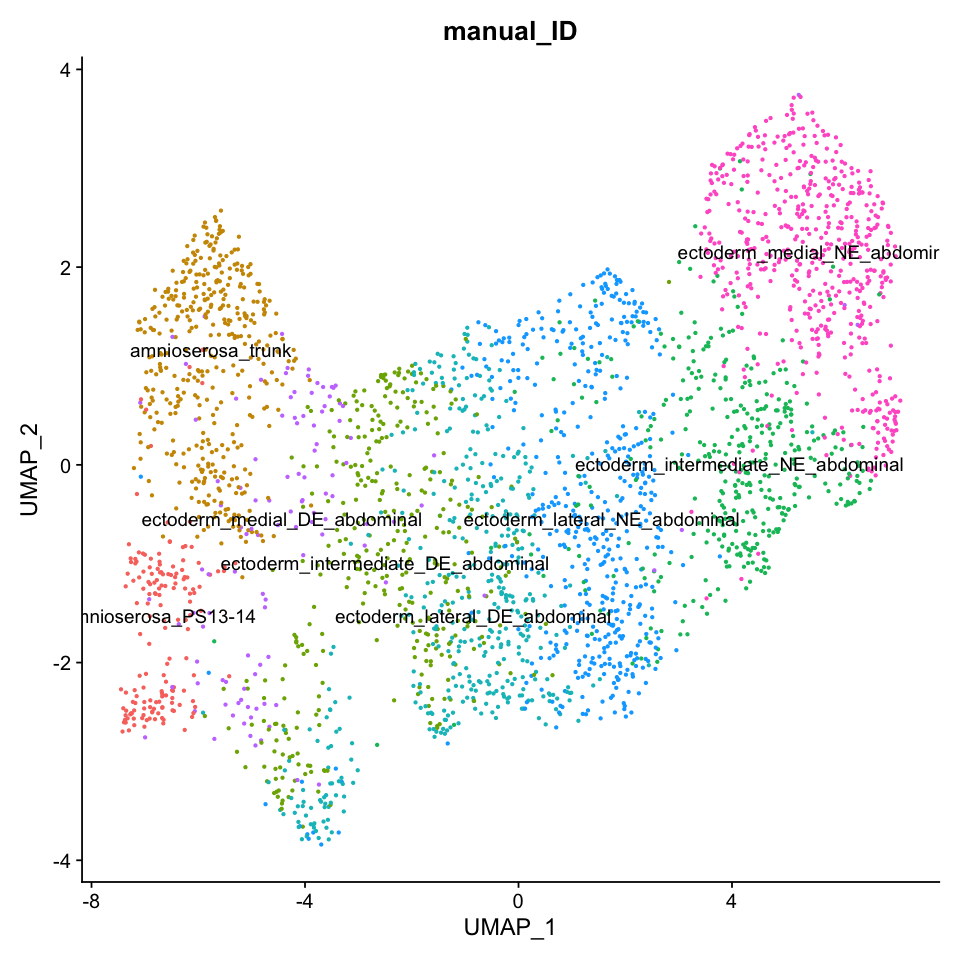

In [41]:
seu.ecto$manual_ID <- merged.id$manual_ID
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu.ecto, reduction = 'umap', group.by = 'manual_ID',label = TRUE) + NoLegend()

In [42]:
Idents(seu.ecto) <- 'manual_ID'
levels(seu.ecto) <- c('amnioserosa_trunk', 'amnioserosa_PS13-14','ectoderm_medial_DE_abdominal',
                      'ectoderm_intermediate_DE_abdominal','ectoderm_lateral_DE_abdominal',
                     'ectoderm_lateral_NE_abdominal','ectoderm_intermediate_NE_abdominal',
                     'ectoderm_medial_NE_abdominal')
all.markers.ecto <- FindAllMarkers(object = seu.ecto, only.pos = TRUE)
nrow(all.markers.ecto)
all.markers.ecto.top10 <- all.markers.ecto %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.ecto.top10)

Calculating cluster amnioserosa_trunk

Calculating cluster amnioserosa_PS13-14

Calculating cluster ectoderm_medial_DE_abdominal

Calculating cluster ectoderm_intermediate_DE_abdominal

Calculating cluster ectoderm_lateral_DE_abdominal

Calculating cluster ectoderm_lateral_NE_abdominal

Calculating cluster ectoderm_intermediate_NE_abdominal

Calculating cluster ectoderm_medial_NE_abdominal



[1] 575

[1] 80

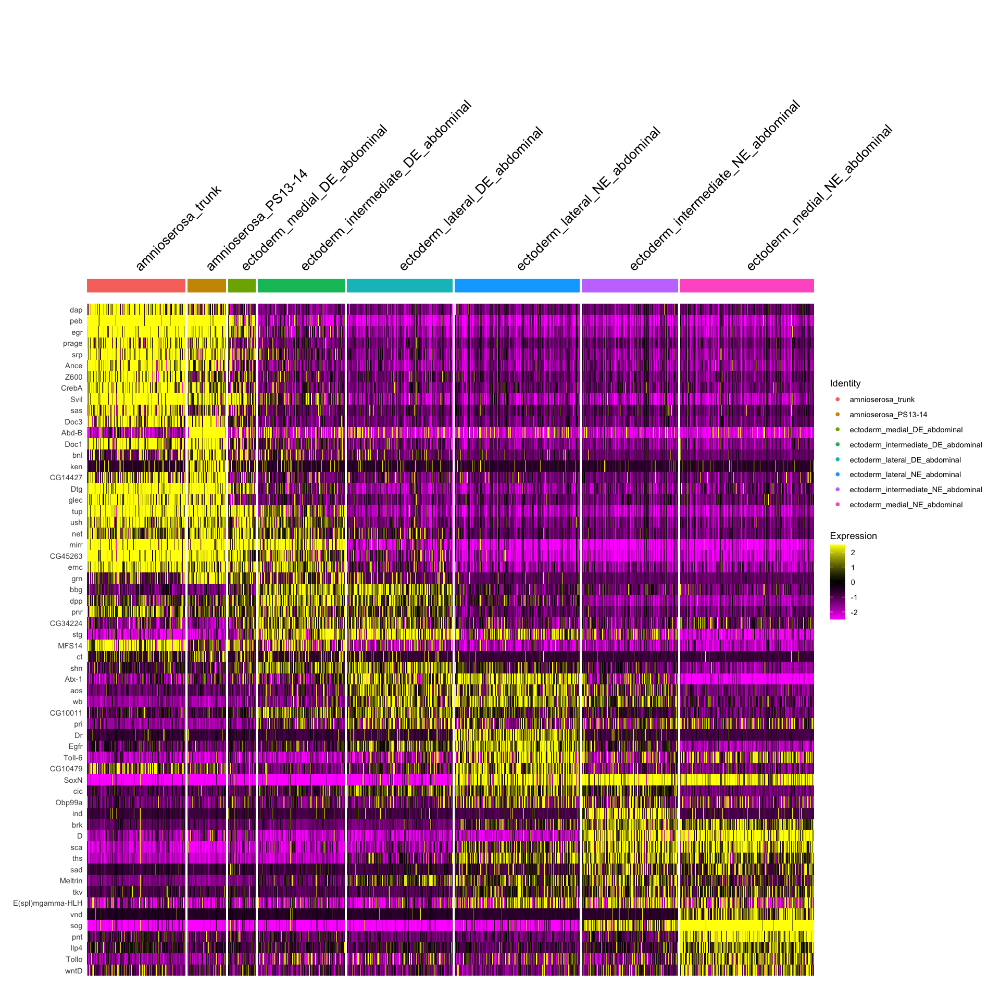

In [43]:
options(repr.plot.width=16, repr.plot.height=16)
DoHeatmap(seu.ecto, features = c(all.markers.ecto.top10$gene))

In [44]:
seu.merge <- merge(x = seu.ecto,y = seu.doublet)
seu.save <- subset(seu_HQC, idents = c(1,2,4,6,9,13))
seu.save$manual_ID <- seu.merge$manual_ID
seu.save

An object of class Seurat 
28612 features across 2926 samples within 2 assays 
Active assay: SCT (11108 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, tsne

In [45]:
seu.others <- subset(seu_HQC, cells = colnames(seu.merge), invert = T)
seu.others$manual_ID <- 'others'
seu.merge <- merge(seu.merge, seu.others)
seu_HQC$manual_ID <- seu.merge$manual_ID

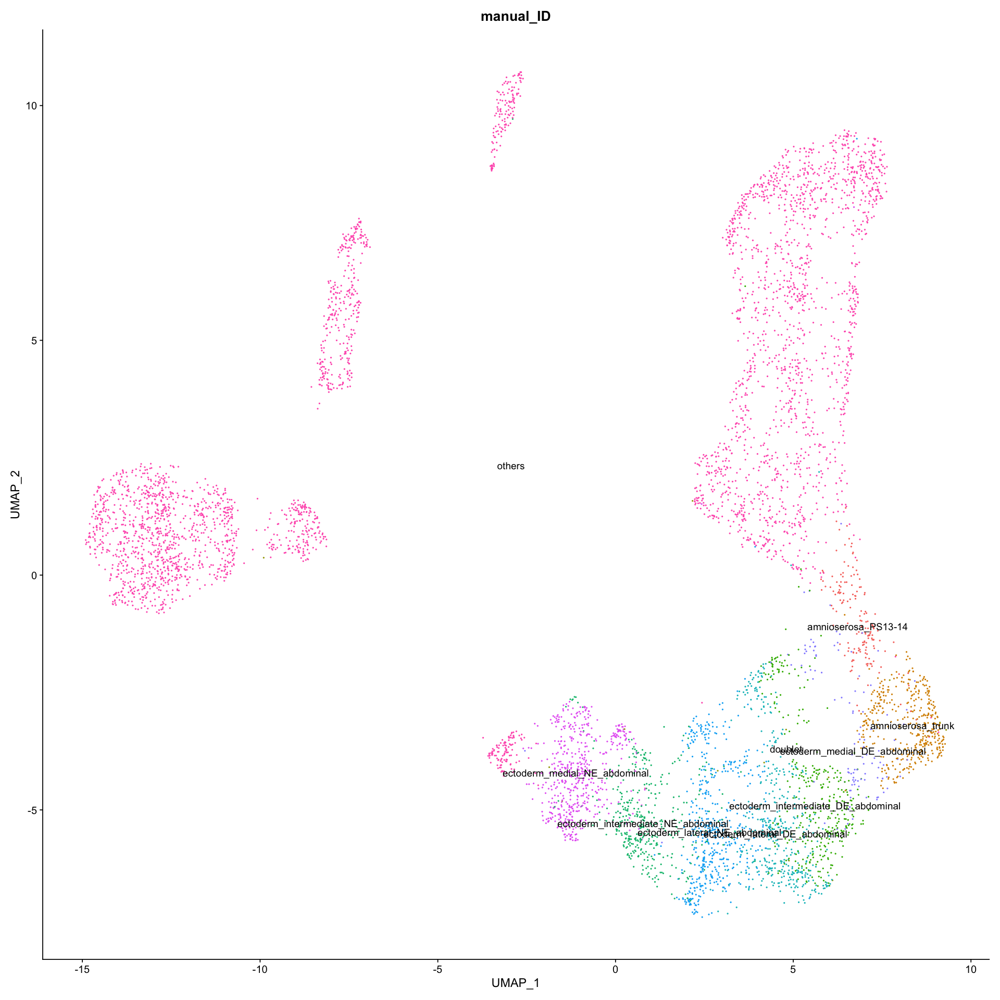

In [46]:
options(repr.plot.width=16, repr.plot.height=16)
DimPlot(seu_HQC, reduction =  "umap", label = TRUE, group.by = 'manual_ID') + NoLegend()

In [47]:
saveRDS(seu.save, file = '../../data/seurat_object/bcdRNAi/subclustering/subclustering_lateral_ecto_bcdRNAi.obj')